In [1]:
import os, glob, re, pickle
from functools import partial
from collections import OrderedDict
from cytoolz import compose
import operator as op

import pandas as pd
import seaborn as sns
import numpy as np
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import pyscenic

from pyscenic.export import export2loom, add_scenic_metadata
from pyscenic.utils import load_motifs
#from pyscenic.transform import df2regulons
from pyscenic.aucell import aucell
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

C:\Users\coron\miniconda3\Lib\site-packages\loompy\bus_file.py:67: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit
C:\Users\coron\miniconda3\Lib\site-packages\loompy\bus_file.py:84: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit
C:\Users\coron\miniconda3\Lib\site-packages\loompy\bus_file.py:101: NumbaDeprecationWarning: The 'nopython' keyword argument was

In [2]:
sc.settings.set_figure_params(dpi=100) #Figure pixel resolution settings

In [3]:
import warnings
warnings.filterwarnings("ignore")

# Fix Index and Tranposition (before HPC based Rcistarget and AUCell calculation)

In [4]:
adata = sc.read_h5ad('C:/Users/coron/OneDrive/Desktop/snRNAseq/Parse_St11_Xenbase/WTSt11_HandAnnotated_TryingTo1000GenesPerCellUpdate_AllFinishedPOG_St11-WT_named.h5ad')

In [5]:
min_cells = 50
adata = adata[:, adata.X.getnnz(axis=0) >= min_cells]

# Reset the var DataFrame
adata.var = pd.DataFrame(index=adata.var_names)
adata.var_names


Index(['nsfl1c', 'ikbkg', 'u2af1', 'phka2', 'nup214', 'mfsd12', 'gpx8',
       'tmem50b', 'hhip', 'cfap20',
       ...
       'skida1', 'plxna3', 'LOC733544', 'LOC100493464', 'znf668',
       'LOC105948415', 'LOC101734659', 'LOC733714', 'LOC116406886',
       'LOC116411650'],
      dtype='object', name='gene_name', length=11195)

In [6]:
gene_names = adata.var_names
adata.var_names

Index(['nsfl1c', 'ikbkg', 'u2af1', 'phka2', 'nup214', 'mfsd12', 'gpx8',
       'tmem50b', 'hhip', 'cfap20',
       ...
       'skida1', 'plxna3', 'LOC733544', 'LOC100493464', 'znf668',
       'LOC105948415', 'LOC101734659', 'LOC733714', 'LOC116406886',
       'LOC116411650'],
      dtype='object', name='gene_name', length=11195)

In [7]:
# Filter genes with non-zero counts in at least 50 cells
min_cells = 50
expressed_genes = adata.var[adata.X.getnnz(axis=0) >= min_cells].index
expressed_genes

Index(['nsfl1c', 'ikbkg', 'u2af1', 'phka2', 'nup214', 'mfsd12', 'gpx8',
       'tmem50b', 'hhip', 'cfap20',
       ...
       'skida1', 'plxna3', 'LOC733544', 'LOC100493464', 'znf668',
       'LOC105948415', 'LOC101734659', 'LOC733714', 'LOC116406886',
       'LOC116411650'],
      dtype='object', name='gene_name', length=11195)

In [8]:
adata.var_names

Index(['nsfl1c', 'ikbkg', 'u2af1', 'phka2', 'nup214', 'mfsd12', 'gpx8',
       'tmem50b', 'hhip', 'cfap20',
       ...
       'skida1', 'plxna3', 'LOC733544', 'LOC100493464', 'znf668',
       'LOC105948415', 'LOC101734659', 'LOC733714', 'LOC116406886',
       'LOC116411650'],
      dtype='object', name='gene_name', length=11195)

In [10]:
# Read the CSV file into a DataFrame
IraTF = pd.read_csv('C:/Users/coron/OneDrive/Desktop/snRNAseq/Stage12_Parse_WT/CompleteTFlist_XtropIraPaper.csv')
IraTF

,Gene
0,adnp
1,adnp2
2,aebp2
3,ahr
4,ahrr
...,...
1030,LOC100489188
1031,klf1
1032,tbx6r
1033,etv3l


In [11]:
import anndata as ad
import pandas as pd

# Assuming 'adata' is your AnnData object and 'IraTF' is your DataFrame

# Preprocess the gene names from the IraTF DataFrame to remove unwanted characters
ira_tf_gene_names = set(IraTF['Gene'].str.strip('" \t'))

# Filter 'adata' to keep only rows that exist in 'ira_tf_gene_names'
adata_filtered = adata[:, adata.var_names.isin(ira_tf_gene_names)]

In [12]:
adata_filtered.var_names

Index(['e4f1', 'kdm5b', 'ddit3', 'dbp', 'meis2', 'smarcc2', 'gabpa', 'ssrp1',
       'thap1', 'rfx3',
       ...
       'sp8', 'prdm2', 'pou5f3.3', 'tp53', 'zbtb21', 'zbtb17', 'znf469',
       'cebpd', 'dlx6', 'znf668'],
      dtype='object', name='gene_name', length=586)

In [15]:
adata_filtered.write('Parse_St11_RefinedClusterMapping_with586IraTFoNLY.h5ad')

In [24]:
expression_matrix = adata.X.A  # Convert to a dense numpy array
expression_matrix = expression_matrix.T  # Transpose to match (cells, genes) shape

# Create a DataFrame with correct indices and columns
gene_expression_df = pd.DataFrame(expression_matrix, columns=adata.obs_names, index=adata.var_names)

# Save the gene expression data to a CSV file
#gene_expression_df.to_csv('St11_AllGene_gene_expression_data.csv')


In [22]:
expression_matrix = adata_filtered.X.A  # Convert to a dense numpy array
expression_matrix = expression_matrix.T  # Transpose to match (cells, genes) shape

# Create a DataFrame with correct indices and columns
gene_expression_df = pd.DataFrame(expression_matrix, columns=adata_filtered.obs_names, index=adata_filtered.var_names)

# Save the gene expression data to a CSV file
gene_expression_df.to_csv('St11_TFonly_gene_expression_data.csv')


In [25]:
# Transpose the gene_expression_df DataFrame
transposed_gene_expression_df = gene_expression_df.T

# Save the transposed DataFrame to a CSV file
transposed_gene_expression_df.to_csv('Stage11_TFonly_gene_expression_Transposed_data.csv', index=True)

# St11 MO WT Combined (Post HPC RcisTarget and AUCell calculation)

In [4]:
adata = sc.read_h5ad('C:/Users/coron/OneDrive/Desktop/snRNAseq/Parse_St11-WT-MO_Combined_FixedIndex.h5ad')

In [5]:
# Assuming adata4 is your AnnData object and it has a column named 'bc_wells' in its .obs attribute
#adata.obs.set_index('bc_wells', inplace=True)
adata.obs

,sample,species,gene_count,tscp_count,mread_count,bc1_well,bc2_well,bc3_well,bc1_wind,bc2_wind,...,pct_counts_ribo,leiden_12.0,leiden_11.9,leiden_12.1,leiden_1.0,leiden_5.0,leiden_8.0,leiden_2.0,leiden_3.0,leiden_10.0
bc_wells,,,,,,,,,,,,,,,,,,,,,
07_01_27__s1,MO_st11.25,xenopus,1401,2758,5813,A7,A1,C3,7,1,...,1.474892,Vent Meso St11-MO,39,38,NaN,NaN,NaN,NaN,NaN,NaN
07_01_35__s1,MO_st11.25,xenopus,2518,9136,19001,A7,A1,C11,7,1,...,0.833200,Vent Inv Endo St11-MO,9,9,NaN,NaN,NaN,NaN,NaN,NaN
07_01_61__s1,MO_st11.25,xenopus,2618,8176,17165,A7,A1,F1,7,1,...,0.993541,NPB St11-MO,16,25,NaN,NaN,NaN,NaN,NaN,NaN
07_01_88__s1,MO_st11.25,xenopus,2753,9066,19578,A7,A1,H4,7,1,...,0.784447,Neural Plate HB St11-MO,87,70,NaN,NaN,NaN,NaN,NaN,NaN
07_02_01__s1,MO_st11.25,xenopus,2253,7089,15305,A7,A2,A1,7,2,...,0.962628,Vent Endo St11-MO,4,4,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
06_95_84__s2,Control_st11.25,xenopus,1649,3230,7798,A6,H11,G12,6,95,...,1.525202,Novel Ecto tp73/foxj1/myb/dscaml1 St11-WT,NaN,NaN,11,52,69,18,11,81
06_95_89__s2,Control_st11.25,xenopus,2018,5416,12481,A6,H11,H5,6,95,...,0.916156,Dors Endo St11-WT,NaN,NaN,6,20,9,16,9,38
06_96_48__s2,Control_st11.25,xenopus,1943,4848,11421,A6,H12,D12,6,96,...,0.713724,Neural Plate St11-WT,NaN,NaN,5,15,4,1,4,63


In [6]:
# Define the hexadecimal color codes
color1_hex = '#838383'
color2_hex = '#D9D9D9'

# Create a custom palette
custom_palette = sns.color_palette([color2_hex, color1_hex])


In [7]:
auc_mtx = pd.read_csv("C:/Users/coron/OneDrive/Desktop/snRNAseq/St11_WT-MO_Adj005_10kb_AllGene_aucell.csv", index_col=0)

In [8]:
auc_mtx.index = adata.obs.index
auc_mtx

,alx1(+),alx4(+),arid5b(+),arnt(+),arntl(+),ascl1(+),ascl2(+),atf2(+),atf3(+),atf7(+),...,yy1(+),zbtb11(+),zbtb21(+),zbtb25(+),zbtb37(+),zeb1(+),zic4(+),znf341(+),znf384(+),znf518a(+)
bc_wells,,,,,,,,,,,,,,,,,,,,,
07_01_27__s1,0.0,0.0,0.0,0.000000,0.000000,0.126673,0.000000,0.000000,0.010230,0.000000,...,0.048353,0.0,0.0,0.007505,0.000000,0.000000,0.000000,0.0,0.000000,0.022893
07_01_35__s1,0.0,0.0,0.0,0.000000,0.001481,0.067369,0.000000,0.000000,0.000000,0.003274,...,0.038723,0.0,0.0,0.000000,0.000229,0.000000,0.000000,0.0,0.000000,0.014495
07_01_61__s1,0.0,0.0,0.0,0.000000,0.000000,0.088359,0.000000,0.000000,0.000000,0.000000,...,0.037597,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.014665
07_01_88__s1,0.0,0.0,0.0,0.000000,0.000000,0.089643,0.000000,0.000000,0.000000,0.000000,...,0.031492,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.008815,0.012051
07_02_01__s1,0.0,0.0,0.0,0.001619,0.000000,0.082860,0.000000,0.000000,0.000000,0.000000,...,0.036726,0.0,0.0,0.000000,0.000000,0.008050,0.000000,0.0,0.006085,0.020108
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
06_95_84__s2,0.0,0.0,0.0,0.000000,0.000000,0.130889,0.000000,0.029331,0.002469,0.000000,...,0.055199,0.0,0.0,0.000000,0.003361,0.000000,0.046659,0.0,0.003354,0.030027
06_95_89__s2,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.032686,0.0,0.0,0.019993,0.028491,0.004703,0.000000,0.0,0.000936,0.018239
06_96_48__s2,0.0,0.0,0.0,0.000000,0.001410,0.078093,0.014499,0.000000,0.000000,0.000000,...,0.039476,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.001989,0.008299


In [9]:
from pyscenic.export import add_scenic_metadata
from pyscenic.cli.utils import load_signatures

sig = load_signatures("C:/Users/coron/OneDrive/Desktop/snRNAseq/St11WT-MO_Adj005_AllGenes_10kbRegions.motifs.csv")
add_scenic_metadata(adata, auc_mtx, sig)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


AnnData object with n_obs × n_vars = 12403 × 21821
    obs: 'sample', 'species', 'gene_count', 'tscp_count', 'mread_count', 'bc1_well', 'bc2_well', 'bc3_well', 'bc1_wind', 'bc2_wind', 'bc3_wind', 'n_genes', 'n_counts', 'doublet_scores', 'predicted_doublets', 'doublet_info', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'leiden_12.0', 'leiden_11.9', 'leiden_12.1', 'leiden_1.0', 'leiden_5.0', 'leiden_8.0', 'leiden_2.0', 'leiden_3.0', 'leiden_10.0', 'Regulon(alx1(+))', 'Regulon(alx4(+))', 'Regulon(arid5b(+))', 'Regulon(arnt(+))', 'Regulon(arntl(+))', 'Regulon(ascl1(+))', 'Regulon(ascl2(+))', 'Regulon(atf2(+))', 'Regulon(atf3(+))', 'Regulon(atf7(+))', 'Regulon(bach1(+))', 'Regulon(bach2(+))', 'Regulon(bbx(+))', 'Regulon(bcl6(+))', 'Regulon(bhlhe40(+))', 'Regulon(bix1.1(+))', 'Regulon(cdx2(+))', 'Regulon(cdx4(+))', 'Regulon(cebpa(+))', 'Regulon(cebpb(+))', 'Regulon(cebpd(+))', 'Regulon(cebpe(+))', 'Regulon(cebpg(+))', 'Regul

In [10]:
rss_cellType = regulon_specificity_scores(auc_mtx, adata.obs["leiden_12.0"])
rss_cellType

,alx1(+),alx4(+),arid5b(+),arnt(+),arntl(+),ascl1(+),ascl2(+),atf2(+),atf3(+),atf7(+),...,yy1(+),zbtb11(+),zbtb21(+),zbtb25(+),zbtb37(+),zeb1(+),zic4(+),znf341(+),znf384(+),znf518a(+)
Vent Meso St11-MO,0.195487,0.205670,0.182560,0.204677,0.202977,0.227468,0.199918,0.191669,0.214602,0.190934,...,0.228709,0.170943,0.176787,0.206892,0.192915,0.195330,0.188825,0.187719,0.225620,0.228162
Vent Inv Endo St11-MO,0.179791,0.176550,0.185186,0.177266,0.175247,0.187895,0.174949,0.180443,0.178577,0.176043,...,0.185914,0.171512,0.169010,0.180191,0.181158,0.182298,0.172848,0.169150,0.182190,0.188001
NPB St11-MO,0.190910,0.203253,0.177147,0.194082,0.195498,0.250682,0.212125,0.187250,0.218785,0.187562,...,0.253314,0.168280,0.181117,0.193196,0.193756,0.195011,0.236035,0.192534,0.256354,0.251572
Neural Plate HB St11-MO,0.175397,0.182416,0.169780,0.177878,0.181777,0.207307,0.181775,0.171949,0.182991,0.176241,...,0.204882,0.169262,0.176783,0.177851,0.174167,0.175965,0.198886,0.175162,0.206246,0.203943
Vent Endo St11-MO,0.183163,0.208618,0.173751,0.181982,0.180236,0.195423,0.174275,0.176922,0.188014,0.181921,...,0.198094,0.167445,0.169751,0.190114,0.187108,0.184221,0.172991,0.183813,0.194338,0.197436
Dors Endo St11-MO,0.181452,0.202282,0.170754,0.179973,0.176291,0.192484,0.182427,0.175331,0.183742,0.176029,...,0.193460,0.167445,0.168357,0.180385,0.181754,0.176248,0.170883,0.174618,0.193977,0.193195
Novel Ecto tp73/epas1/dscaml1 St11-MO,0.168371,0.172935,0.167445,0.170862,0.170592,0.174590,0.170719,0.171058,0.171397,0.173028,...,0.175373,0.167445,0.167445,0.172982,0.173874,0.170539,0.173702,0.167445,0.173667,0.175749
Neural Plate St11-MO,0.221401,0.223585,0.190241,0.214331,0.219618,0.237305,0.220255,0.201411,0.257596,0.206235,...,0.248781,0.170508,0.188886,0.223898,0.217914,0.217805,0.261597,0.210168,0.246629,0.248668
Novel Ecto (tp73/dscaml1) St11-MO,0.187694,0.181193,0.172946,0.180225,0.177602,0.186727,0.186762,0.171028,0.188683,0.176170,...,0.188477,0.174919,0.178320,0.177008,0.173772,0.178534,0.185201,0.187081,0.187934,0.190506
Cement Gland St11-MO,0.177307,0.177167,0.171011,0.172906,0.182752,0.205814,0.177209,0.174440,0.181690,0.173883,...,0.204488,0.167445,0.174915,0.178330,0.179005,0.175644,0.175290,0.175800,0.196843,0.202729


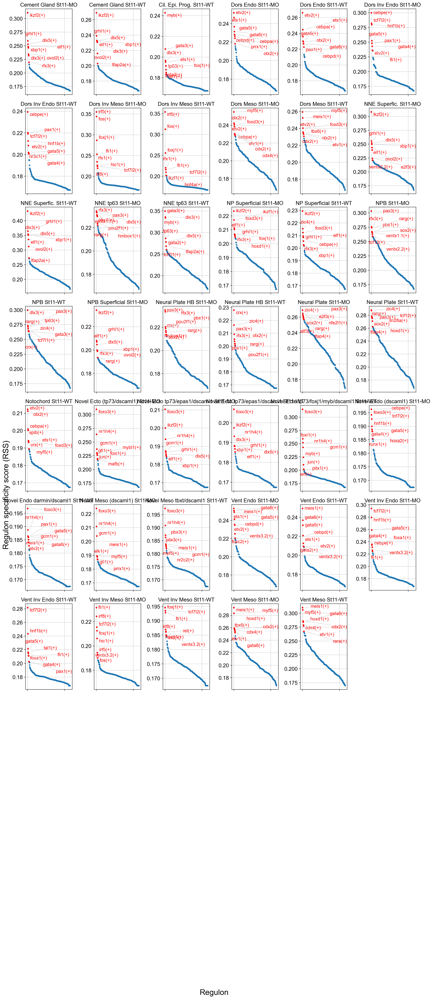

In [11]:
cats = sorted(list(set(adata.obs["leiden_12.0"])))

fig = plt.figure(figsize=(15, 36))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(10,6,num)
    plot_rss(rss_cellType, c, top_n=8, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical', size='x-large')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
plt.savefig("Stage11_WT-MO_cellType-RSS-top10.pdf", dpi=600, bbox_inches = "tight")
plt.show()

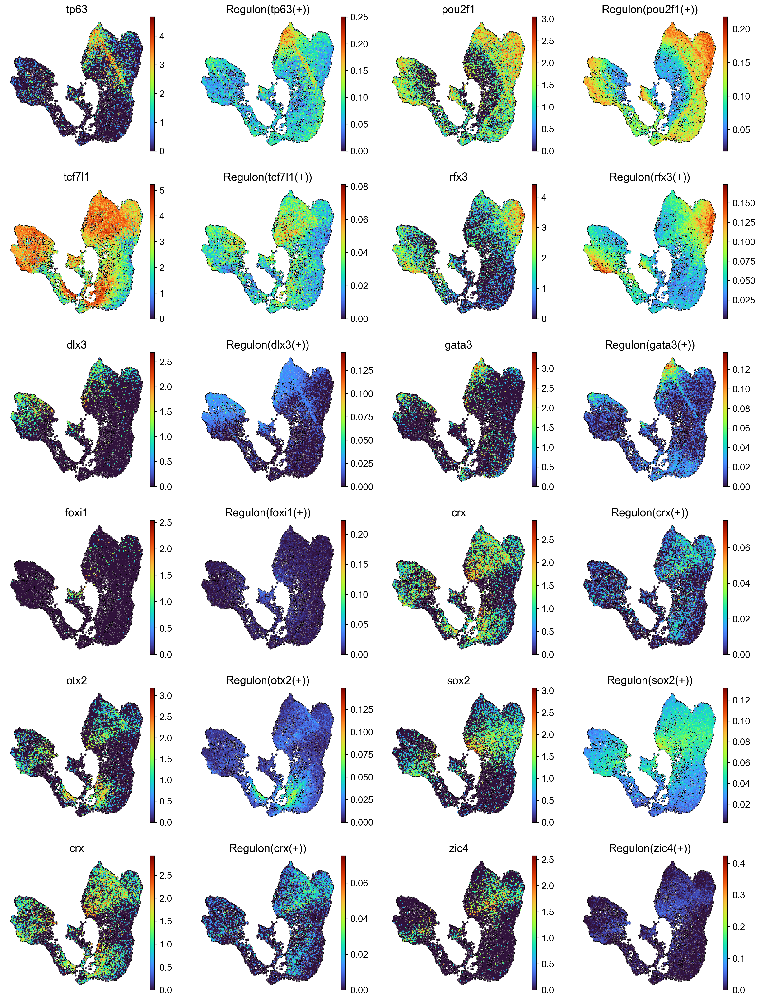

In [12]:
sc.pl.umap(adata, color=['tp63', 'Regulon(tp63(+))', 'pou2f1', 'Regulon(pou2f1(+))', 'tcf7l1', 'Regulon(tcf7l1(+))', 'rfx3', 'Regulon(rfx3(+))',
                        'dlx3', 'Regulon(dlx3(+))', 'gata3', 'Regulon(gata3(+))', 'foxi1', 'Regulon(foxi1(+))', 'crx', 'Regulon(crx(+))',
                         'otx2', 'Regulon(otx2(+))', 'sox2', 'Regulon(sox2(+))', 'crx', 'Regulon(crx(+))', 'zic4', 'Regulon(zic4(+))'
                        ], palette="tab20",
           color_map=plt.cm.turbo, na_color='grey',
           add_outline=True, size=15, frameon=False,
            legend_fontsize=8, alpha=1)

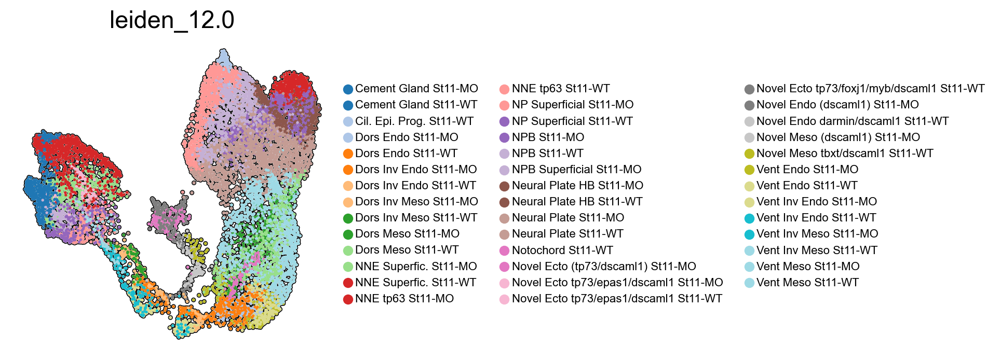

In [13]:
sc.pl.umap(adata, color=['leiden_12.0' ], palette="tab20",
           color_map=plt.cm.turbo, na_color='grey',
           add_outline=True, size=15, frameon=False,
            legend_fontsize=8, alpha=1)

In [14]:
# Assuming 'GermLayerBroad' is a column in your combined_adata.obs
St11_ecto_subset = adata[adata.obs['leiden_12.0'].isin(['NNE tp63 St11-MO', 'NNE tp63 St11-WT', 
                                                                          'Cil. Epi. Prog. St11-WT', 'NPB St11-MO',
                                                                          'NPB St11-WT', 'Neural Plate HB St11-MO', "Neural Plate HB St11-WT",
                                                                          'Neural Plate St11-WT', "Neural Plate St11-MO", "NPB Superficial St11-MO", "NP Superficial St11-MO",
                                                        "NP Superficial St11-WT",
                                                                
                                                      "NNE Superfic. St11-MO", "NNE Superfic. St11-WT", "Cement Gland St11-MO", "Cement Gland St11-WT"])].copy()

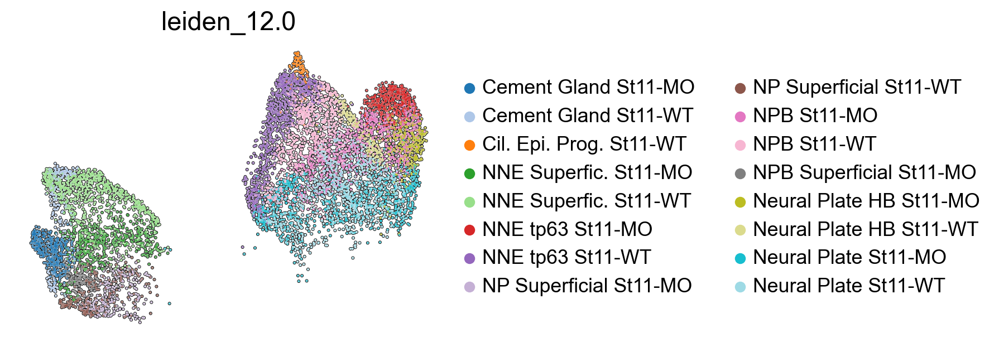

In [15]:
# Plot the UMAP with the outline width adjusted
with plt.rc_context({'figure.figsize': (5, 3.5)}):  # Set width to 14 and height to 7
    sc.pl.umap(St11_ecto_subset, color=['leiden_12.0'], palette="tab20",
           color_map=plt.cm.turbo, na_color='black',
           add_outline=True, outline_width=(.25, 0.01), size=8, frameon=False,
          )#legend_fontsize=8, alpha=1, show=False)#, vmax=3.5)


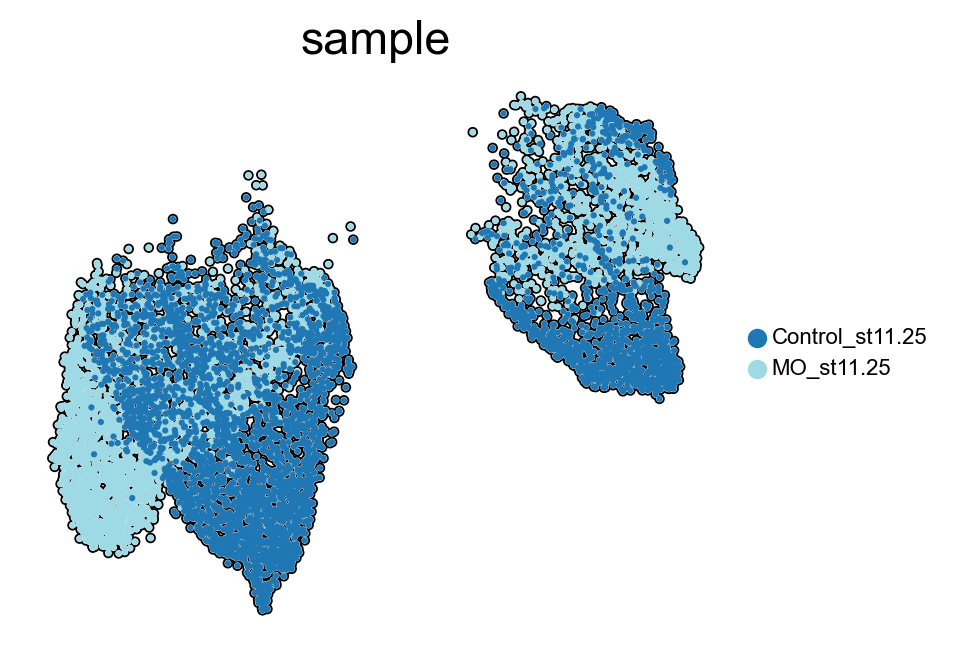

In [16]:
# Assuming your AnnData object is called adata and UMAP has already been calculated
umap_coords = St11_ecto_subset.obsm['X_umap']

# Rotate the coordinates by changing the sign of both x and y
rotated_umap_coords = -umap_coords

# Replace the original UMAP coordinates with the rotated ones
St11_ecto_subset.obsm['X_umap'] = rotated_umap_coords

with plt.rc_context({'figure.figsize': (5, 3.5)}):  # Set width to 14 and height to 7
    sc.pl.umap(St11_ecto_subset, color=['sample'], palette="tab20",
           color_map=plt.cm.turbo, na_color='grey',
           add_outline=True, size=20, frameon=False,
            legend_fontsize=8, alpha=1)

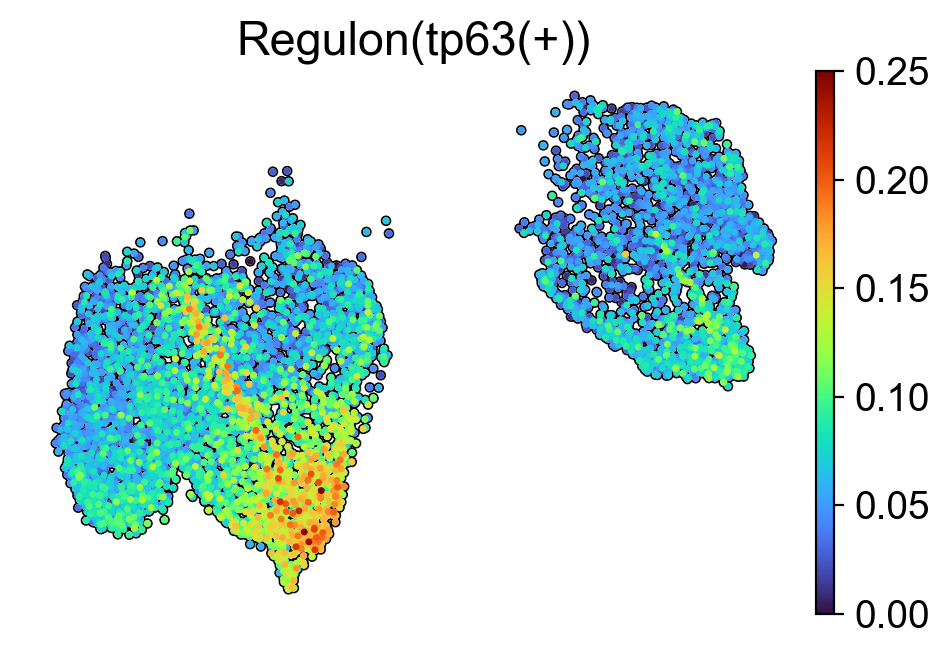

In [17]:
# Adjust the figure size using rc_context
with plt.rc_context({'figure.figsize': (5, 3.5)}):  # Set width to 14 and height to 7
    sc.pl.umap(St11_ecto_subset, color=['Regulon(tp63(+))'], palette="tab20",
               color_map=plt.cm.turbo, na_color='black',
               add_outline=True, outline_width=(.25, 0.01), size=25, frameon=False,
               legend_fontsize=8, alpha=1, show=True, vmax=.25)  # Change show=False to show=True to display the plot


In [18]:
auc_mtx_Z = pd.DataFrame( index=auc_mtx.index )
for col in list(auc_mtx.columns):
    auc_mtx_Z[ col ] = ( auc_mtx[col] - auc_mtx[col].mean()) / auc_mtx[col].std(ddof=0)
#auc_mtx_Z.sort_index(inplace=True)

In [19]:
import pandas as pd

# Specify the conditions for subsetting
conditions = [
    "NNE tp63 St11-MO", "NNE tp63 st11-WT", "Cil. Epi. Prog. St11-WT", 
    "NPB St11-MO", "NPB St11-WT", "Neural Plate St11-MO", 
    "Neural Plate St11-WT", "Neural Plate HB St11-MO", "Neural Plate HB St11-WT", "NNE Superfic. St11-MO", "NNE Superfic. St11-WT",
    "Cement Gland St11-MO", "Cement Gland St11-WT"
]

# Extract the barcodes from adata that match the specified conditions
matching_barcodes = adata.obs[adata.obs['leiden_12.0'].isin(conditions)].index

# Subset auc_mtx_Z using these barcodes
subset_auc_mtx_Z = auc_mtx_Z.loc[matching_barcodes]

# Verify the subset
print(subset_auc_mtx_Z.head())


               alx1(+)   alx4(+)  arid5b(+)   arnt(+)  arntl(+)  ascl1(+)  \
bc_wells                                                                    
07_01_61__s1 -0.236356 -0.376184  -0.095624 -0.274779  -0.26002  0.722557   
07_01_88__s1 -0.236356 -0.376184  -0.095624 -0.274779  -0.26002  0.765545   
07_02_07__s1 -0.236356  0.233871  -0.095624 -0.274779  -0.26002  0.271182   
07_02_42__s1 -0.236356 -0.376184  -0.095624 -0.274779  -0.26002  0.642722   
07_03_12__s1 -0.236356 -0.376184  -0.095624 -0.274779  -0.26002  0.857663   

              ascl2(+)   atf2(+)   atf3(+)   atf7(+)  ...    yy1(+)  \
bc_wells                                              ...             
07_01_61__s1 -0.265561 -0.180294 -0.543991 -0.249196  ... -0.040171   
07_01_88__s1 -0.265561 -0.180294 -0.543991 -0.249196  ... -0.637417   
07_02_07__s1 -0.265561 -0.180294 -0.543991 -0.249196  ... -0.921371   
07_02_42__s1  2.854554 -0.180294 -0.543991  4.221098  ... -0.615830   
07_03_12__s1 -0.265561 -0.180294  

In [20]:
topreg = []
for i,c in enumerate(cats):
    topreg.extend(
        list(rss_cellType.T[c].sort_values(ascending=False)[:5].index)
    )
topreg = list(set(topreg))

In [21]:
auc_mtx_Z = pd.DataFrame( index=auc_mtx.index )
for col in list(auc_mtx.columns):
    auc_mtx_Z[ col ] = ( auc_mtx[col] - auc_mtx[col].mean()) / auc_mtx[col].std(ddof=0)
#auc_mtx_Z.sort_index(inplace=True)

In [22]:
cats = sorted(list(set(adata.obs["sample"])))
colors = sns.color_palette('bright',n_colors=len(cats) )
colorsd = dict( zip( cats, colors ))
colormap = [ colorsd[x] for x in adata.obs["sample"] ]

In [23]:
import seaborn as sns

# Specify the conditions for subsetting
conditions = [
    "NNE tp63 St11-MO", "NNE tp63 st11-WT", "Cil. Epi. Prog. St11-WT", 
    "NPB St11-MO", "NPB St11-WT", "Neural Plate St11-MO", 
    "Neural Plate St11-WT", "Neural Plate HB St11-MO", "Neural Plate HB St11-WT", "NNE Superfic. St11-MO", "NNE Superfic. St11-WT",
    "Cement Gland St11-MO", "Cement Gland St11-WT"
]

# Subset adata based on the specific annotations in leiden_12.0
subset_adata = adata[adata.obs['leiden_12.0'].isin(conditions)]

# Extract unique sample categories in the subset
cats_subset = sorted(list(set(subset_adata.obs["sample"])))

# Generate a color palette
colors_subset = sns.color_palette('bright', n_colors=len(cats_subset))

# Create a dictionary mapping each category to a color
colorsd_subset = dict(zip(cats_subset, colors_subset))

# Create a color list for the subset
colormap_subset = [colorsd_subset[x] for x in subset_adata.obs["sample"]]

# Verify the color mapping
print(colorsd_subset)
print(colormap_subset[:10])  # Print first 10 to verify


{'Control_st11.25': (0.00784313725490196, 0.24313725490196078, 1.0), 'MO_st11.25': (1.0, 0.48627450980392156, 0.0)}
[(1.0, 0.48627450980392156, 0.0), (1.0, 0.48627450980392156, 0.0), (1.0, 0.48627450980392156, 0.0), (1.0, 0.48627450980392156, 0.0), (1.0, 0.48627450980392156, 0.0), (1.0, 0.48627450980392156, 0.0), (1.0, 0.48627450980392156, 0.0), (1.0, 0.48627450980392156, 0.0), (1.0, 0.48627450980392156, 0.0), (1.0, 0.48627450980392156, 0.0)]


In [24]:
import seaborn as sns

# Specify the conditions for subsetting
conditions = [
    "NNE tp63 St11-MO", "NNE tp63 st11-WT", "Cil. Epi. Prog. St11-WT", 
    "NPB St11-MO", "NPB St11-WT", "Neural Plate St11-MO", 
    "Neural Plate St11-WT", "Neural Plate HB St11-MO", "Neural Plate HB St11-WT", "NNE Superfic. St11-MO", "NNE Superfic. St11-WT",
    "Cement Gland St11-MO", "Cement Gland St11-WT"
]

# Subset adata based on the specific annotations in leiden_12.0
subset_adata = adata[adata.obs['leiden_12.0'].isin(conditions)]

# Extract unique sample categories in the subset
cats_subset = sorted(list(set(subset_adata.obs["sample"])))

# Define the custom colors
custom_colors = ['#ababab', '#4d4d4d']

# Ensure the number of colors matches the number of categories
if len(cats_subset) > len(custom_colors):
    custom_colors = sns.color_palette("bright", n_colors=len(cats_subset))

# Create a dictionary mapping each category to a color
colorsd_subset = dict(zip(cats_subset, custom_colors))

# Create a color list for the subset
colormap_subset = [colorsd_subset[x] for x in subset_adata.obs["sample"]]

# Verify the color mapping
print(colorsd_subset)
print(colormap_subset[:10])  # Print first 10 to verify


{'Control_st11.25': '#ababab', 'MO_st11.25': '#4d4d4d'}
['#4d4d4d', '#4d4d4d', '#4d4d4d', '#4d4d4d', '#4d4d4d', '#4d4d4d', '#4d4d4d', '#4d4d4d', '#4d4d4d', '#4d4d4d']


In [25]:
# Print the mapping of samples to their assigned colors
for sample, color in colorsd.items():
    print(f"{sample}: {color}")


Control_st11.25: (0.00784313725490196, 0.24313725490196078, 1.0)
MO_st11.25: (1.0, 0.48627450980392156, 0.0)


In [26]:
import pandas as pd

# Convert auc_mtx_Z to a DataFrame if it's not already
auc_mtx_Z = pd.DataFrame(auc_mtx_Z)

# Ensure tp63(+) is in the columns
if 'tp63(+)' not in auc_mtx_Z.columns:
    raise ValueError("tp63(+) not found in auc_mtx_Z columns")

# Ensure 'sample' is in the annotations of subset_adata
if 'sample' not in subset_adata.obs.columns:
    raise ValueError("'sample' column not found in subset_adata.obs")

# Filter the subset_adata to get the barcodes for 'Control_st11.25' and 'MO_st11.25'
control_barcodes = subset_adata[subset_adata.obs['sample'] == 'Control_st11.25'].obs.index
mo_barcodes = subset_adata[subset_adata.obs['sample'] == 'MO_st11.25'].obs.index

# Filter auc_mtx_Z for these barcodes
control_z_scores = auc_mtx_Z.loc[auc_mtx_Z.index.intersection(control_barcodes), 'tp63(+)']
mo_z_scores = auc_mtx_Z.loc[auc_mtx_Z.index.intersection(mo_barcodes), 'tp63(+)']

# Count the number of z-scores >= 2
control_high_z_scores = (control_z_scores >= 2).sum()
mo_high_z_scores = (mo_z_scores >= 2).sum()

# Print the results
print(f"Number of barcodes with tp63 z-score >= 2 in Control_st11.25: {control_high_z_scores}")
print(f"Number of barcodes with tp63 z-score >= 2 in MO_st11.25: {mo_high_z_scores}")


Number of barcodes with tp63 z-score >= 2 in Control_st11.25: 227
Number of barcodes with tp63 z-score >= 2 in MO_st11.25: 2


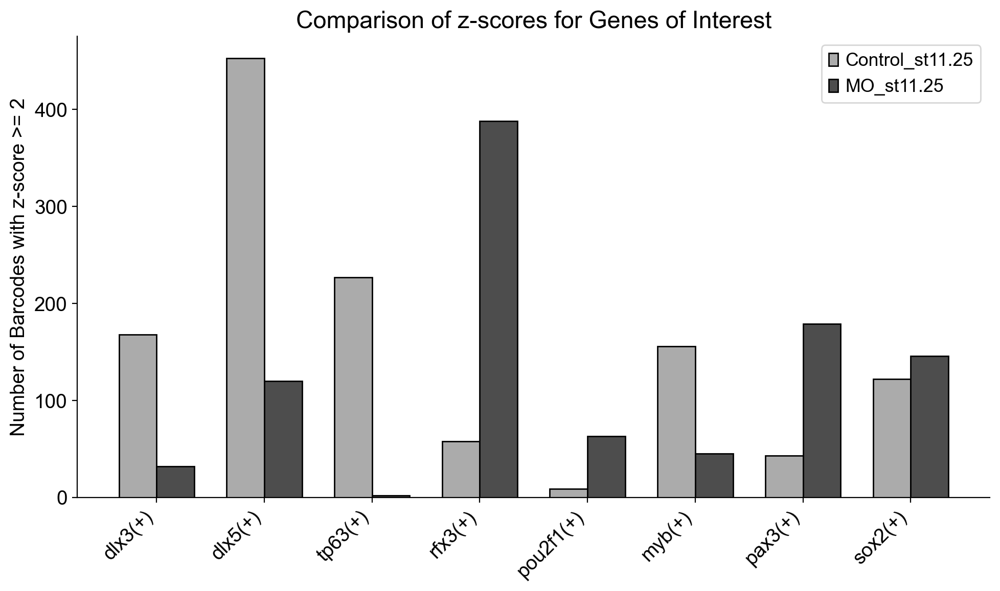

In [27]:
import pandas as pd
import matplotlib.pyplot as plt

# List of genes of interest
genes_of_interest = ['dlx3(+)', 'dlx5(+)', 'tp63(+)', 'rfx3(+)', 'pou2f1(+)', 'myb(+)', 'pax3(+)', 'sox2(+)']

# Ensure all genes are in the columns
for gene in genes_of_interest:
    if gene not in auc_mtx_Z.columns:
        raise ValueError(f"{gene} not found in auc_mtx_Z columns")

# Ensure 'sample' is in the annotations of subset_adata
if 'sample' not in subset_adata.obs.columns:
    raise ValueError("'sample' column not found in subset_adata.obs")

# Filter the subset_adata to get the barcodes for 'Control_st11.25' and 'MO_st11.25'
control_barcodes = subset_adata[subset_adata.obs['sample'] == 'Control_st11.25'].obs.index
mo_barcodes = subset_adata[subset_adata.obs['sample'] == 'MO_st11.25'].obs.index

# Initialize dictionaries to hold counts for each gene
control_counts = {gene: 0 for gene in genes_of_interest}
mo_counts = {gene: 0 for gene in genes_of_interest}

# Count the number of z-scores >= 2 for each gene in each group
for gene in genes_of_interest:
    control_z_scores = auc_mtx_Z.loc[auc_mtx_Z.index.intersection(control_barcodes), gene]
    mo_z_scores = auc_mtx_Z.loc[auc_mtx_Z.index.intersection(mo_barcodes), gene]
    control_counts[gene] = (control_z_scores >= 2).sum()
    mo_counts[gene] = (mo_z_scores >= 2).sum()

# Prepare data for bar chart
genes = genes_of_interest
counts_control = [control_counts[gene] for gene in genes]
counts_mo = [mo_counts[gene] for gene in genes]

# Plotting
x = np.arange(len(genes))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, counts_control, width, label='Control_st11.25', color='#ababab', edgecolor='black')
rects2 = ax.bar(x + width/2, counts_mo, width, label='MO_st11.25', color='#4d4d4d', edgecolor='black')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Number of Barcodes with z-score >= 2')
ax.set_title('Comparison of z-scores for Genes of Interest')
ax.set_xticks(x)
ax.set_xticklabels(genes, rotation=45, ha='right')
ax.legend()

# Remove gridlines
ax.grid(False)

# Keep only the left and bottom spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


In [28]:
auc_mtx_Z

targets = ['dlx3(+)', 'dlx5(+)', 'tp63(+)', 'rfx3(+)', 'pbx1(+)', "pou2f1(+)","myb(+)", 'pax3(+)', 'sox2(+)']  

C:\Users\coron\miniconda3\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
C:\Users\coron\miniconda3\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


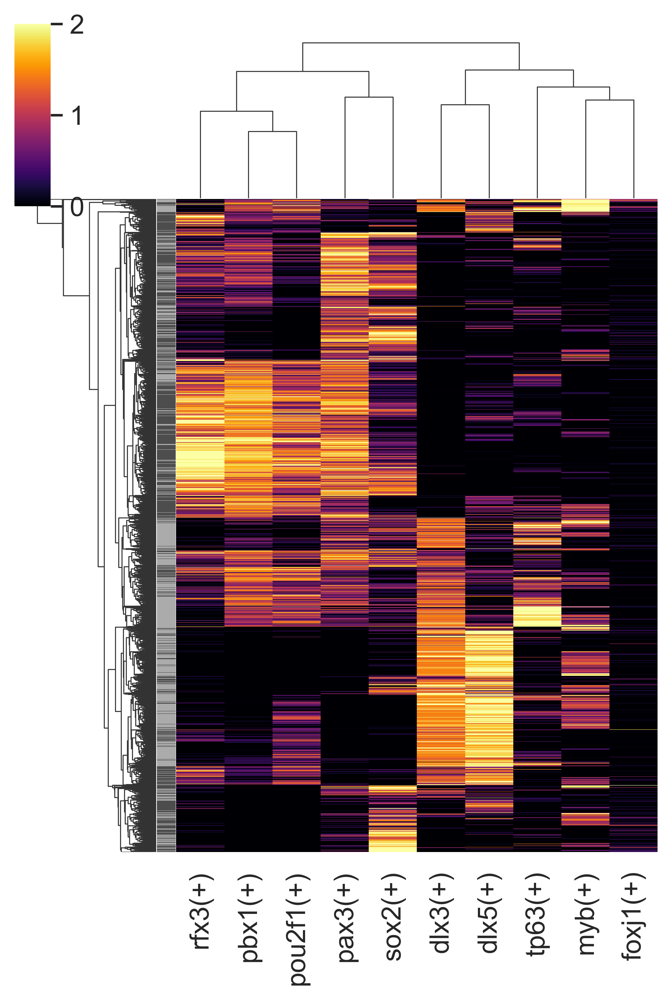

In [108]:
sns.set(font_scale=1.2)
g = sns.clustermap(subset_auc_mtx_Z[targets], annot=False,  square=False,  linecolor='gray',
    yticklabels=False, xticklabels=True, vmin=0, vmax=2, row_colors=colormap_subset,
    cmap="inferno", figsize=(5,7) )
g.cax.set_visible(True)
g.ax_heatmap.set_ylabel('')
g.ax_heatmap.set_xlabel('')
plt.savefig("Stage11_WT-MO_Regulon_heatmap-topreg.pdf", dpi=200, bbox_inches = "tight")
